# Marketing Engineering Project - New Super Markets International (NEW SMI)
<p> Cluster subgroups of customers and predict their reaction 


## Dataset description

- **CustID** id customer
- **Education Academic Degree**
- **Marital_Status Marital Status**
- **Age Age (years)**
- **Gender Gender**
- **Dependents If the customer has dependents in the household**
- **Income Household net income (yearly)**
- **Frequency Number of purchases (invoices) in 2021**
- **Recency # days since last purchase**
- **Perishables Amount spent on this LoB in 2021**
- **Beverages Amount spent on this LoB in 2021**
- **Frozen Amount spent on this LoB in 2021**
- **Canned Amount spent on this LoB in 2021**
- **Others       Amount spent on this LoB in 2021**
- **Internet % of sales over the Internet**
- **NPS       Adapted Net Promoter Score (1-5)**

## Work description

### Overview
<p> You are asked to develop a clustering for a more advanced MKGT strategy and to predict the outcome of a specific target.
<p> In addition to the prediction we are evaluating the Cost opportunity of and efficacy of the model by estimating costs and gained investments given by the model prediction accuracy</p>



# <font color='#BFD72F'>Contents</font> <a class="anchor" id="toc"></a>

* [1 - Data Import & exploration](#imp_exp)
    * [1.1 - Imports](#imp)
* [2 - Data Prepartion](#prep)
    * [2.1 - Summary Exploration](#summary)
    * [2.2 - Numerical variables insights](#num_ins)
    * [2.3 - Categorical variables insights](#cat_ins)
    * [2.4 - ANOVA Test](#anova)
* [3 - Data preparation](#prep)
    * [3.1 - Data cleaning](#clean)
    * [3.2 - Feature Engineering](#engi)
* [4 - Models + evaluations](#cluster)
    * [4.1 - RFM](#rfm)
    * [4.2 - PCA & Clustering](#cluster)
        * [4.2.1 - Preparing Component reduction](#SVD)
        * [4.2.2 - Kmeans](#kmeans)
        * [4.2.3 - K-Prototype](#proto)
        * [4.2.4 - Kmeans & Kprototype](#eval)
    * [4.3 - Classification: Logistic regression](#logistic)
        * [4.3.1 - Modelling classification](#class)
        * [4.3.2 - Evaluation Classification](#ev_class)
    * [4.4 - Xg Boost](#XG)
        * [4.3.1 - ](#base)
        * [4.3.2](#d)
        * [4.3.3]
    * [4.2.1 - Comments on models](#final_1)
* [5 - Overall evaluation and MKGT recommendations](#recom)
    

# <font color='#BFD72F'>1 - Data Import & exploration</font> <a class="anchor" id="imp_exp"></a>

## <font color='#BFD72F'>1.1 - Imports</font> <a class="anchor" id="imp"></a>

In [1]:
# Loading packages
import os 
import math
import numpy as np
import pandas as pd

import missingno 
import category_encoders as ce
import plotly.express as px

import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns

from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest

from ipywidgets import interact, interact_manual
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn import preprocessing, metrics
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import silhouette_score

from sklearn.preprocessing import QuantileTransformer

from scipy.cluster.hierarchy import fcluster, linkage
from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression 
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import collections

from scipy.stats import loguniform
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold


Files to use 

* Segmentation has 8000 customers with everything - even potentially the customer that have been removed later 
* Scoring dataset: contains on sheet 2 the target for 1790 (group A) customers and for the rest nothing (group B)
* Training ALL variables contains all variables for group A customers and nothing for group B

Scoring --> test dataset <br>
Training ALL --> test  <br>
Scoring + Training ALL = Cleaned Segmentation + Target variable <br>
Objective is creating the target for the rest 6000<br>

In [2]:
subPlots_Title_fontSize = 12
subPlots_xAxis_fontSize = 10
subPlots_yAxis_fontSize = 10
subPlots_label_fontSize = 10
heatmaps_text_fontSize = 8

plots_Title_fontSize = 14
plots_Title_textColour = 'black'

plots_Legend_fontSize = 12
plots_Legend_textColour = 'black'

plots_barTexts_fontSize = 8

In [3]:
# files to use# 

ds_train = pd.read_excel('Mkt Eng Analytics Project Data - Training dataset (ALL VARIABLES).xlsx')
ds_test = pd.read_excel('Mkt Eng Analytics Project Data - Scoring dataset.xlsx', sheet_name= 'Train-Complete')
ds_full = ds_train.append(ds_test)
ds_full.columns = [str.lower(x) for x in ds_full.columns]
ds = ds_full.copy(deep = True)
ds = ds.sort_values(by = 'custid', ascending = True).reset_index()
ds['custid'] = ds['custid'].astype(str) 
ds.drop(axis = 1, columns = ['index'], inplace = True)
ds.head()

/var/folders/tq/sy_s9jc96zj8wmk_td48vkn00000gn/T/ipykernel_57773/1015475517.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ds_full = ds_train.append(ds_test)


,custid,education,marital_status,age,gender,dependents,income,frequency,recency,perishables,beverages,frozen,canned,others,internet,nps,target
0,1,BSc,Together,20.0,F,0,71825.8,45.0,31.0,5188.38,3941.56,144.00,1447.92,638.64,90,4,NaN
1,2,BSc,Together,19.0,F,1,56058.2,14.0,17.0,1665.30,97.60,12.00,0.00,168.60,34,3,1.0
2,3,BSc,Married,22.0,M,1,78099.2,34.0,40.0,3711.00,1533.88,1283.52,445.32,1235.52,46,5,NaN
3,4,Primary,Single,18.0,M,0,18324.2,17.0,24.0,-1.80,-6.24,43.44,-15.12,18.00,36,3,0.0
4,5,Primary,Married,22.0,M,1,19699.4,6.0,48.0,-17.28,-77.76,40.32,-492.48,60.00,56,3,NaN


In [4]:
ds.index.is_unique


True

In [5]:
ds.describe().T

,count,mean,std,min,25%,50%,75%,max
age,7993.0,21.101589,2.717043,17.00,19.00,21.00,23.00,99.00
dependents,8000.0,0.685750,0.464245,0.00,0.00,1.00,1.00,1.00
income,7985.0,46516.067852,18872.240877,36.20,31501.80,46462.40,61449.80,191402.00
frequency,7995.0,20.840901,11.177630,1.00,12.00,18.00,29.00,61.00
recency,7987.0,61.056467,57.704995,1.00,27.00,54.00,79.50,365.00
perishables,7999.0,1936.978410,2151.292208,-540.36,173.94,1203.84,3147.93,19892.34
beverages,8000.0,748.355480,996.353007,-250.00,86.39,312.00,1062.30,12441.92
frozen,7998.0,519.887552,801.711963,-413.04,96.27,211.20,601.74,9061.12
canned,8000.0,449.611555,817.416827,-629.76,14.73,134.64,541.68,19599.28
others,8000.0,527.021115,777.481587,-498.72,113.97,235.68,617.28,13074.08


### First check on data quality
- The ds seem to be quite complete, with few missing values and no duplicatation. Later we will try to treat the missing values case by case, to avoid to lose observations.

- Attributes to be treated: Marital_Status, Education, Income, Recency, Gender, Perishables and Frozen.

- For the numerical features we can populate the missing value with the Mean, without major impact in the data quality.

- For the categorical features we can populate the missing value with the most_frequent valeu, without major impact in the data quality.



# <font color='#BFD72F'>2 - Data preparation</font> <a class="anchor" id="prep"></a>

## <font color='#BFD72F'>2.1 - Summary Exploration</font> <a class="anchor" id="summary"></a>

In [6]:
ds.head()

,custid,education,marital_status,age,gender,dependents,income,frequency,recency,perishables,beverages,frozen,canned,others,internet,nps,target
0,1,BSc,Together,20.0,F,0,71825.8,45.0,31.0,5188.38,3941.56,144.00,1447.92,638.64,90,4,NaN
1,2,BSc,Together,19.0,F,1,56058.2,14.0,17.0,1665.30,97.60,12.00,0.00,168.60,34,3,1.0
2,3,BSc,Married,22.0,M,1,78099.2,34.0,40.0,3711.00,1533.88,1283.52,445.32,1235.52,46,5,NaN
3,4,Primary,Single,18.0,M,0,18324.2,17.0,24.0,-1.80,-6.24,43.44,-15.12,18.00,36,3,0.0
4,5,Primary,Married,22.0,M,1,19699.4,6.0,48.0,-17.28,-77.76,40.32,-492.48,60.00,56,3,NaN


## <font color='#BFD72F'>2.2 - Numerical variables insights</font> <a class="anchor" id="num_ins"></a>


- Distribution are Skeeled for major part of the variables. Income and Internet with a bell-shape resemblance.

**Outliers**

- Age - few observations close to 100. Not anormal but depending on the model, this could impact the performance

- Income - few observations close to 200k. Not anormal but depending on the model, this could impact the performance

- Frequency - Few observations from 150 to above 200.

- Recency - a lot of variables above the last quartile, however, this is totaly possible. Important info to be used in the marketing campaigns, as a target for dorment consumers.

- Internet - This variables means the percentage of online purchase. there are some observations with 101, meaning 101%,which is not feasible.

*Outliers Treatment*

- Considering that for Age, Income, Frequency and recency the outliers are not anormal, we will keep them.
- For internet as is not possible to have 101% of sales online, we will, change to 100%.



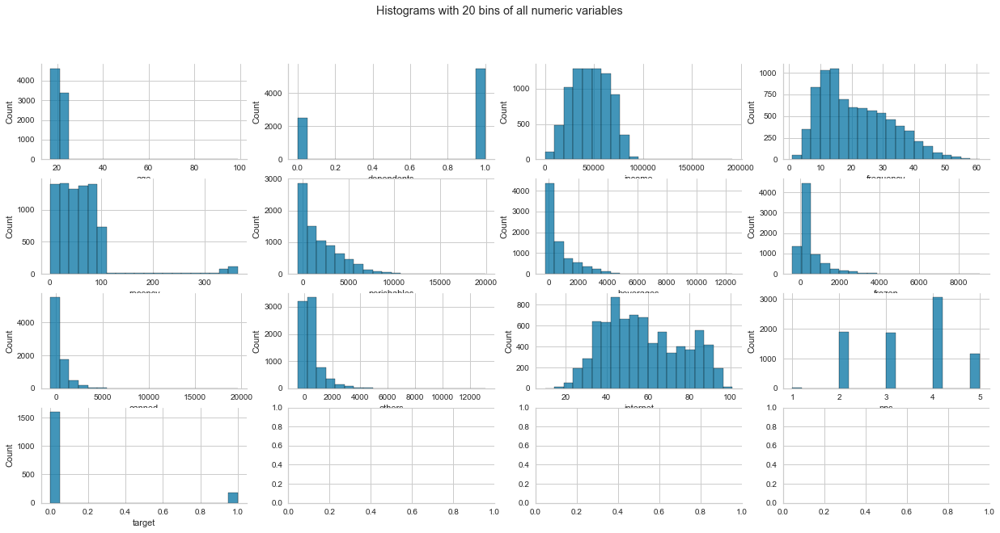

In [7]:
# HISTOGRAM (ALL NUMERIC VARIABLES)

# Identify all numeric variables in the dataset
numerical=ds.select_dtypes(include=[np.number]).columns.tolist()

# Draw
fig, ax = plt.subplots(4, 4, figsize=(21,10))
for var, subplot in zip(ds[numerical], ax.flatten()):
    g = sns.histplot(data=ds,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Decoration
sns.despine()
plt.rc('axes')
fig.suptitle("Histograms with 20 bins of all numeric variables");


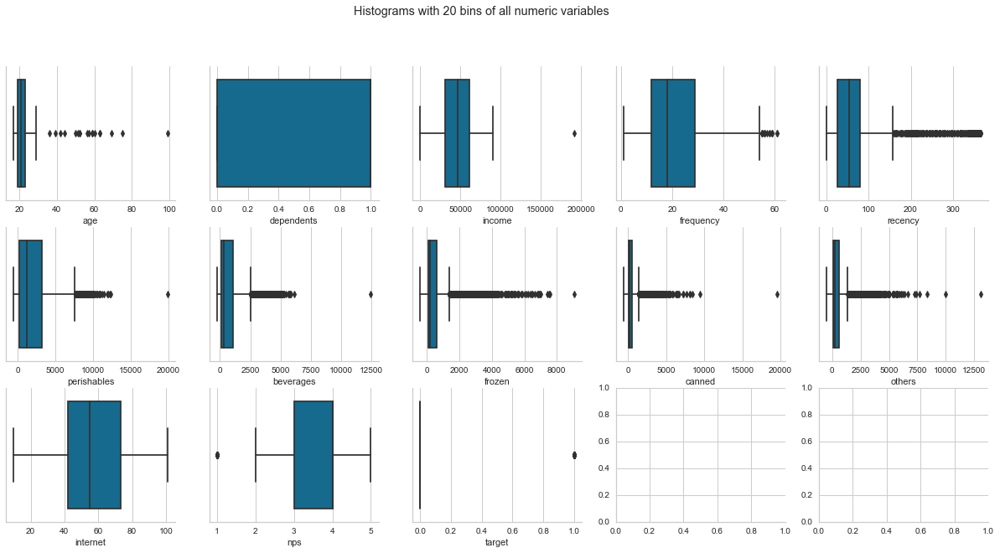

In [8]:
# HISTOGRAM (ALL NUMERIC VARIABLES)


# Draw
fig, ax = plt.subplots(3, 5, figsize=(21,10))
for var, subplot in zip(ds[numerical], ax.flatten()):
    g = sns.boxplot(data=ds,
                 x=var,
                 ax=subplot)

# Decoration
sns.despine()
plt.rc('axes')
fig.suptitle("Histograms with 20 bins of all numeric variables");

In [9]:
fig = px.histogram(ds, x='gender',
        barmode= 'group',  histfunc='count'
                    )
fig.show()



In [10]:
fig = px.histogram(ds, x='marital_status',
        barmode= 'group',  histfunc='count'
                    )
fig.show()

In [11]:

fig = px.histogram(ds, x='education',
        barmode= 'group',  histfunc='count'
                    )
fig.show()


## <font color='#BFD72F'>2.3 - Categorical variables insights</font> <a class="anchor" id="cat_ins"></a>

- Median Age of 21yo
- Most of customers are Men.
- Most of the customers are Married of with a Partner.
- Most of the customer hold a BSc or MSc Degree.
- Median Frequency of 20 times/year.


In [12]:

# Create correlation matrix
numerical=ds.select_dtypes(include=[np.number]).columns.tolist()

def correlation_heatmap(ds, columns, method):

    corr = ds[columns].corr(method=method)
    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask)]= True

    # Draw
    fig , ax = plt.subplots(figsize=(18, 20))
    heatmap = sns.heatmap(corr,
                        mask = mask,
                        square = True,
                        linewidths = .5,
                        cmap = 'coolwarm',
                        cbar_kws = {'shrink': .4,
                                    'ticks' : [-1, -.5, 0, 0.5, 1]},
                        fmt='.4f',
                        vmin = -1,
                        vmax = 1,
                        annot = True,
                        )

    # Decoration
    plt.title("Spearman correlation between numeric variables")
    ax.set_yticklabels(corr.columns, rotation = 0)
    ax.set_xticklabels(corr.columns, rotation = 45)
    sns.set_style({'xtick.bottom': True}, {'ytick.left': True})
    

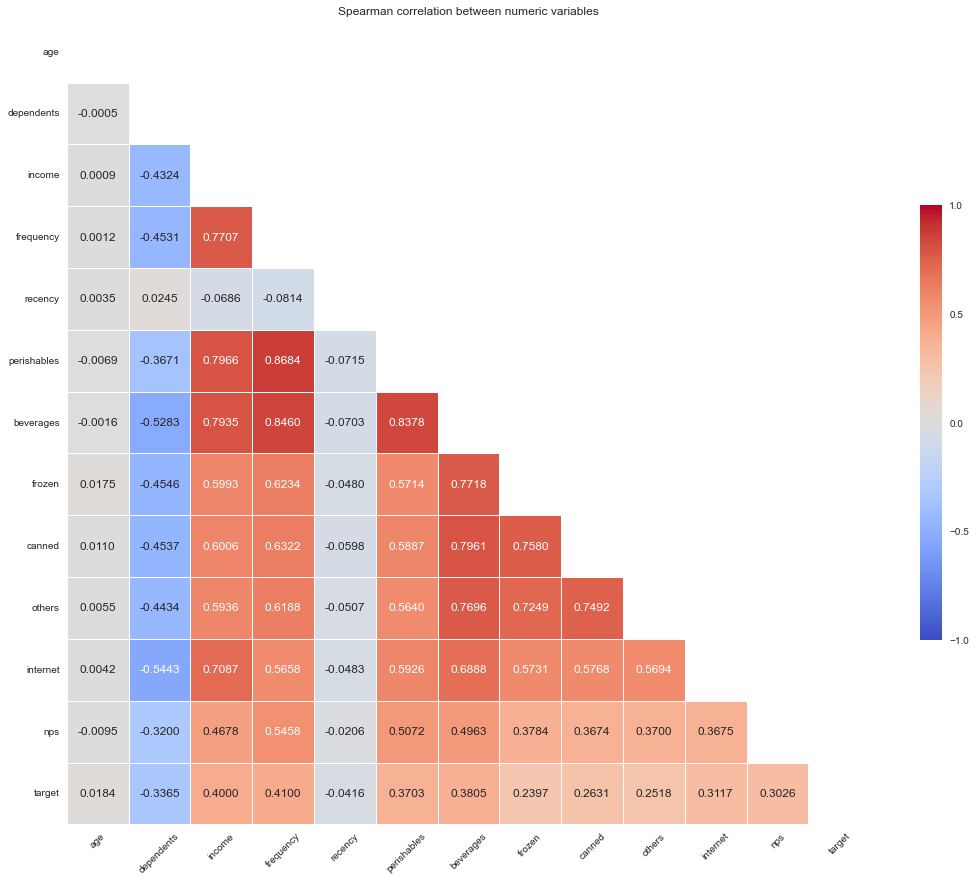

In [13]:
correlation_heatmap(ds, numerical, 'spearman')

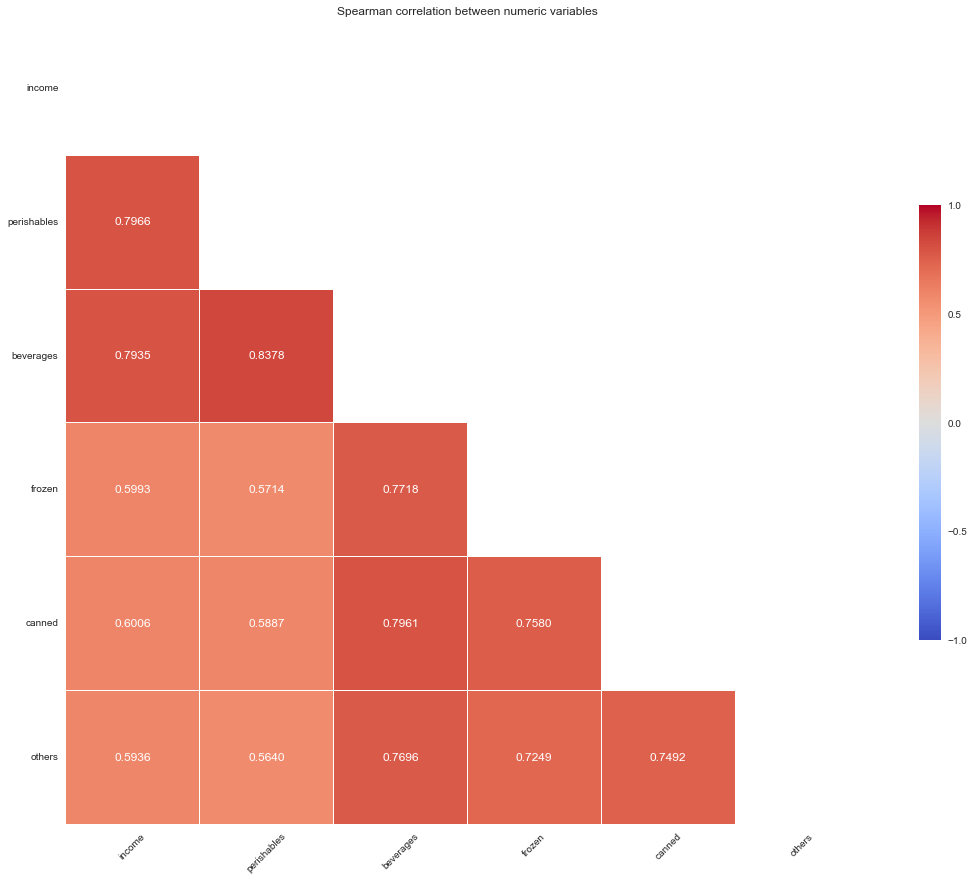

In [14]:
correlation_heatmap(ds, ['income', 'perishables', 'beverages', 'frozen', 'canned', 'others'], 'spearman')

* dependents and Age will stay as they are not related to anything
* income is seriously connected to other variables so maybe batter to treat differently or drop 
    * especially with beverages and perishables, maybe because the cost more
    * beverages canned and forzen are related with amost everything 
    * an option could be taking the expenses and turn them into "bundles" given by a cluster only on these expenses 


## <font color='#BFD72F'>2.4 - ANOVA Test</font> <a class="anchor" id="anova"></a>


In [15]:
# categorical 

categorical=ds.select_dtypes(exclude=[np.number]).columns.tolist()
categorical


data = ds[categorical].merge(ds[['custid', 'target']],how = 'inner', on = 'custid' )
data = data.loc[data.target.isin([0,1])]
data = data.fillna(0)
data = data.drop(axis = 1, columns = ['custid', 'target'])
data = pd.get_dummies(data).fillna(0)


In [16]:
data.shape


(1778, 16)

In [17]:
target = ds['target'].dropna()

anova = SelectKBest(f_classif, k=8)
X_anova = anova.fit_transform(data, target)


In [18]:

selected_features = pd.Series(anova.get_support(), index = data.columns)
selected_features
selected_params = pd.Series(anova.get_params())


In [19]:
selected_features.to_frame().reset_index().sort_values(by = 0, ascending = False)

,index,0
0,education_0,True
3,education_MSc,True
4,education_PhD,True
5,education_Primary,True
9,marital_status_Single,True
11,marital_status_Widow,True
13,gender_F,True
14,gender_M,True
1,education_BSc,False
2,education_High School,False


In general education and marital status should be taken into account for the targeting. We will process them in the data preparation phase.

# <font color='#BFD72F'>3 - Data Preparation</font> <a class="anchor" id="prep"></a>

## <font color='#BFD72F'>3.1 - Data cleaning</font> <a class="anchor" id="clean"></a>

In this section we proceed with cleaning the dataset and extra manipulation of main features, such as creating new variables.

In [20]:
print('columns to be imputed: ' + str([ x for x in 
                                        ds.columns[ds.isnull().sum() >0]
                                        ]))

columns to be imputed: ['education', 'marital_status', 'age', 'gender', 'income', 'frequency', 'recency', 'perishables', 'frozen', 'target']


In [21]:
ds.columns

Index(['custid', 'education', 'marital_status', 'age', 'gender', 'dependents',
       'income', 'frequency', 'recency', 'perishables', 'beverages', 'frozen',
       'canned', 'others', 'internet', 'nps', 'target'],
      dtype='object')

In [22]:

# input to Numerical Missing Values
ds_clean = ds.copy(deep = True)

imp_freq = SimpleImputer(missing_values=np.nan, strategy='median')
ds_clean['age'] = imp_freq.fit_transform(ds_clean[['age']])
ds_clean['income'] = imp_freq.fit_transform(ds_clean[['income']])
ds_clean['frequency'] = imp_freq.fit_transform(ds_clean[['frequency']])
ds_clean['recency'] = imp_freq.fit_transform(ds_clean[['recency']])
ds_clean['perishables'] = imp_freq.fit_transform(ds_clean[['perishables']])
ds_clean['frozen'] = imp_freq.fit_transform(ds_clean[['frozen']])

# remove the negative values by attributing rnaomd 
ds_clean['perishables'] = np.where(ds_clean['perishables'] < 0 , np.nan, ds_clean['perishables']) 
ds_clean['frozen']      = np.where(ds_clean['frozen'] < 0 , np.nan, ds_clean['frozen']) 
ds_clean['others']      = np.where(ds_clean['others'] < 0 , np.nan, ds_clean['others']) 
ds_clean['canned']      = np.where(ds_clean['canned'] < 0 , np.nan, ds_clean['canned']) 
ds_clean['beverages']   = np.where(ds_clean['beverages'] < 0 , np.nan, ds_clean['beverages']) 

import random 



ds_clean['perishables'] = ds_clean['perishables'].apply(lambda x: np.random.choice(ds_clean['perishables'].dropna().values) if np.isnan(x) else x)
ds_clean['frozen'] = ds_clean['frozen'].apply(lambda x: np.random.choice(ds_clean['frozen'].dropna().values) if np.isnan(x) else x)
ds_clean['others'] = ds_clean['others'].apply(lambda x: np.random.choice(ds_clean['others'].dropna().values) if np.isnan(x) else x)
ds_clean['canned'] = ds_clean['canned'].apply(lambda x: np.random.choice(ds_clean['canned'].dropna().values) if np.isnan(x) else x)
ds_clean['beverages'] = ds_clean['beverages'].apply(lambda x: np.random.choice(ds_clean['beverages'].dropna().values) if np.isnan(x) else x)


# input to Categorical Missing Values

imp_freq_cat = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
ds_clean['gender'] = np.where(ds_clean['gender'] == 'Other', np.nan, ds_clean['gender'])
ds_clean['gender'] = imp_freq_cat.fit_transform(ds_clean[['gender']])

ds_clean['education'] = imp_freq_cat.fit_transform(ds_clean[['education']])
ds_clean['marital_status'] = imp_freq_cat.fit_transform(ds_clean[['marital_status']])

ds_clean['gender'] = np.where(ds_clean['gender'] == 'other', np.nan, ds_clean['gender'])


ds_clean['recency'] = np.where(ds_clean['recency'] >= 100, np.nan, ds_clean['recency'])
ds_clean['recency'] = ds_clean['recency'].apply(lambda x: np.random.choice(ds_clean['recency'].dropna().values) if np.isnan(x) else x)

# smooth the values of purchase to get a more normal distribution

ds_clean['log_perishables'] = ds_clean['perishables'].apply(lambda x: np.sqrt(np.sqrt(x))) 
ds_clean['log_frozen']      = ds_clean['frozen'].apply(lambda x: np.sqrt(np.sqrt(x))) 
ds_clean['log_others']      = ds_clean['others'].apply(lambda x: np.sqrt(np.sqrt(x))) 
ds_clean['log_canned']      = ds_clean['canned'].apply(lambda x: np.sqrt(np.sqrt(x))) 
ds_clean['log_beverages']   = ds_clean['beverages'].apply(lambda x: np.sqrt(np.sqrt(x))) 



# Check the no. of missing values.
ds_clean.isna().sum()


custid                0
education             0
marital_status        0
age                   0
gender                0
dependents            0
income                0
frequency             0
recency               0
perishables           0
beverages             0
frozen                0
canned                0
others                0
internet              0
nps                   0
target             6222
log_perishables       0
log_frozen            0
log_others            0
log_canned            0
log_beverages         0
dtype: int64

In the cleaning we imputed the missing values in order to fill NAs. We mostly used the median or the most frequent values approach. 
In terms of cleaning we didn't removed the negative values from the purhcases, as in the modelling were giving issues and we thought they might have been cancellations from online orders still taken into account into the order system, therefore still relevant to distinguish customers. 

### <font color='#BFD72F'>3.2.1 - Visuals of Data cleaning</font> <a class="anchor" id="clean"></a>

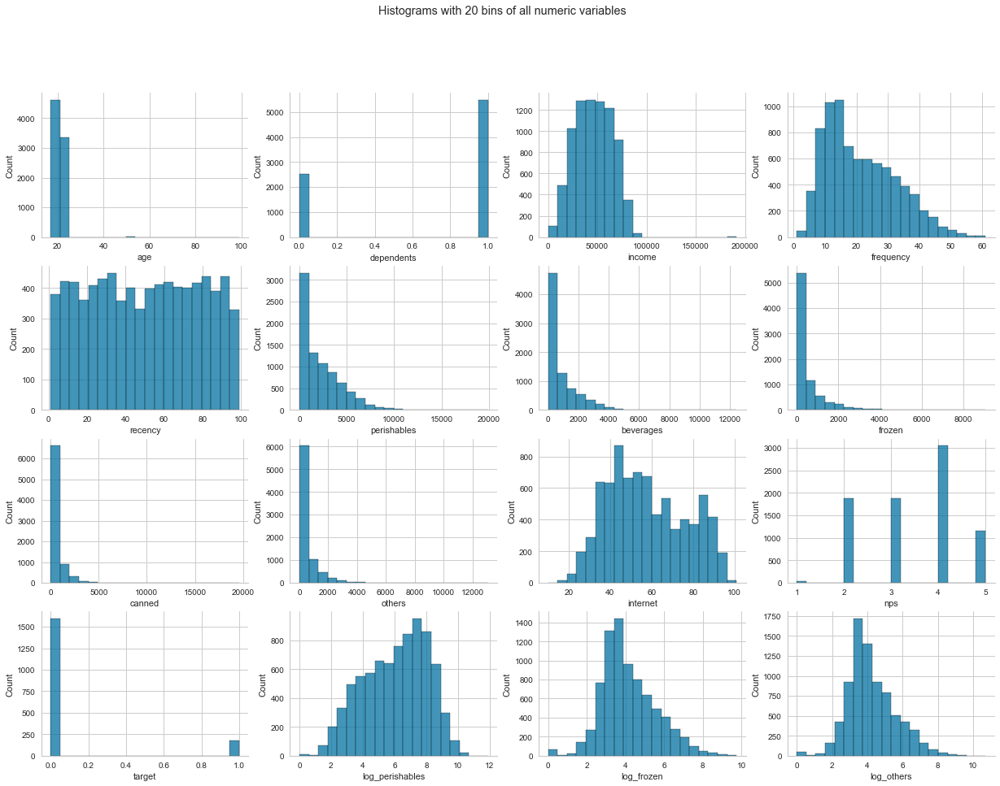

In [23]:
clean_numerical=ds_clean.select_dtypes(include=[np.number]).columns.tolist()

# HISTOGRAM (ALL NUMERIC VARIABLES)

# Identify all numeric variables in the dataset


# Draw
fig, ax = plt.subplots(4, 4, figsize=(21,15))
for var, subplot in zip(ds_clean[clean_numerical], ax.flatten()):
    g = sns.histplot(data=ds_clean,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Decoration
sns.despine()
plt.rc('axes')
fig.suptitle("Histograms with 20 bins of all numeric variables");


In [24]:
# Outliers cleanup 
# removal of outlier 

def removeOutliers (df, colList, lowPercentile=0.0025, highPercentile=0.9975, verbose=False):    
    quant_df = df[colList].quantile([lowPercentile, highPercentile])
    if verbose:
        print(quant_df)
    for name in list(df[colList].columns):
        df = df[(df[name] >= quant_df.loc[lowPercentile, name]) & (df[name] <= quant_df.loc[highPercentile, name])]
    return df

## <font color='#BFD72F'>3.2 - Feature Engineering</font> <a class="anchor" id="engi"></a>

### Features Creation
- Total purchases value (sum of Perishables, Beverages, Frozen, Canned and Other)
- Avg value per purchase (sum of Perishables, Beverages, Frozen, Canned and Other) / Frequency
- Profile = concatenating Marital_Status with Education
- Online_Purchase_Value = Total_Purchases * Internet % / 100
- spend / income
- format of the Marital status and education into less cardinality
- split Food and long lasting goods purchases 

In [25]:
ds_clean["total_purchases"] = (
    ds_clean["perishables"] + 
    ds_clean["beverages"] + 
    ds_clean["frozen"] + 
    ds_clean["canned"] +
    ds_clean["others"]
)

ds_clean['avg_purchase_value'] = (
    ds_clean['total_purchases'] /
    ds_clean['frequency']
)

ds_clean['profile'] = (
    ds_clean['marital_status'] + '-' + 
    ds_clean['education']
)

ds_clean['online_purchase_value'] = (
    ds_clean['total_purchases'] *
    ds_clean['internet'] / 100
)

ds_clean['spend_over_income'] = (
    ds_clean['total_purchases'] /
    ds_clean['income']
)

ds_clean['bundle_food'] = (
    ds_clean["perishables"] + 
    ds_clean["beverages"]
)

ds_clean['bundle_storage'] = (
    ds_clean["frozen"] + 
    ds_clean["canned"] +
    ds_clean["others"]
)

ds_clean['share_bundle_food'] = ds_clean['bundle_food']/ ds_clean["total_purchases"]
ds_clean['share_bundle_storage'] = 1 - ds_clean['share_bundle_food']


print(f'dataset dimensions: --> rows: {ds_clean.shape[0]} , columns: {ds_clean.shape[1]} ')
# modify and simplify education and marital status level 


marital_convert = { 'Together'  :'together',
                    'Married'   :'together',
                    'Single'    :'alone',
                    'Divorced'  :'alone',
                    'Widow'     :'alone'}

education_converter = {'BSc'            : 'high', 
                        'Primary'       :'low',
                        'High School'   :'low',
                        'MSc'           :'high',
                        'PhD'           :'high'
                        }

ds_clean['marital'] = ds_clean['marital_status'].apply(lambda x : marital_convert[x]) 
ds_clean['educ_lev'] = ds_clean['education'].apply(lambda x : education_converter[x])
# onehot econding


ds_clean_save = ds_clean.copy(deep = True)

ds_clean.drop(axis = 1, columns = ['custid', 'marital_status', 'education', 'profile'], inplace = True)
# Encode categorical variables to dummy variables

# save before any encoding 
X_before_encoding = ds_clean.copy(deep = True) 

cols = ['educ_lev', 'marital', 'gender']
ce_one_hot = ce.OneHotEncoder(cols = cols, use_cat_names=True)
ds_clean = ce_one_hot.fit_transform(ds_clean)

# remove redundant
ds_clean = ds_clean.drop(columns = ['marital_alone', 'educ_lev_high', 'gender_M'])

ds_clean.head(5)

dataset dimensions: --> rows: 8000 , columns: 31 


,age,gender_F,dependents,income,frequency,recency,perishables,beverages,frozen,canned,...,total_purchases,avg_purchase_value,online_purchase_value,spend_over_income,bundle_food,bundle_storage,share_bundle_food,share_bundle_storage,marital_together,educ_lev_low
0,20.0,1,0,71825.8,45.0,31.0,5188.38,3941.56,144.00,1447.92,...,11360.50,252.455556,10224.4500,0.158167,9129.94,2230.56,0.803657,0.196343,1,0
1,19.0,1,1,56058.2,14.0,17.0,1665.30,97.60,12.00,0.00,...,1943.50,138.821429,660.7900,0.034669,1762.90,180.60,0.907075,0.092925,1,0
2,22.0,0,1,78099.2,34.0,40.0,3711.00,1533.88,1283.52,445.32,...,8209.24,241.448235,3776.2504,0.105113,5244.88,2964.36,0.638900,0.361100,1,0
3,18.0,0,0,18324.2,17.0,24.0,1605.42,1594.08,43.44,413.28,...,3674.22,216.130588,1322.7192,0.200512,3199.50,474.72,0.870797,0.129203,0,1
4,22.0,0,1,19699.4,6.0,48.0,360.00,1590.48,40.32,187.20,...,2238.00,373.000000,1253.2800,0.113608,1950.48,287.52,0.871528,0.128472,1,1


In [26]:

px.scatter(ds_clean, x = 'share_bundle_food', y = 'share_bundle_storage')

In [27]:
outliers = ['dependents','income', 'frequency', 'recency', 'internet', 'nps', 'share_bundle_food', 'share_bundle_storage']

ds_clean = removeOutliers(ds_clean, colList=outliers , lowPercentile=0.01, highPercentile=0.99, verbose=True)

print(f'dataset dimensions: --> rows: {ds_clean.shape[0]} , columns: {ds_clean.shape[1]} ')

      dependents     income  frequency  recency  internet  nps  \
0.01         0.0   7743.822        4.0     1.99      24.0  2.0   
0.99         1.0  83661.984       49.0    98.00      94.0  5.0   

      share_bundle_food  share_bundle_storage  
0.01           0.067567              0.026859  
0.99           0.973141              0.932433  
dataset dimensions: --> rows: 7323 , columns: 29 


The overall cleaning has been quite impactful, but after different attempts we saw better peformance with 1% of removal on both sides. 

## <font color='#BFD72F'>3.4 - New Features Visualization</font> <a class="anchor" id="engi"></a>

In [28]:
fig = px.histogram(ds_clean, x='gender_F', y=['total_purchases','perishables', 'beverages', 'frozen','canned','others'],
        barmode= 'group',  histfunc='sum'
                    )

fig.update_layout(
    height=400,
    title_text='Total Purchases and Product category spend vs Gender'
)

fig.show()


In [29]:
fig = px.histogram(ds_clean, x='marital_together', y=['total_purchases','perishables', 'beverages', 'frozen','canned','others'],
        barmode= 'group',  histfunc='sum'
                    )

fig.update_layout(
    height=400,
    title_text='Total Purchases and Product category spend vs Marital Situation'
)

fig.show()

In [30]:
fig = px.histogram(ds_clean, x='educ_lev_low', y=['total_purchases','perishables', 'beverages', 'frozen','canned','others'],
        barmode= 'group',  histfunc='sum'
                    )

fig.update_layout(
    height=400,
    title_text='Total Purchases and Product category spend vs Education Level'
)
fig.show()

In [31]:
fig = px.histogram(ds_clean, x='educ_lev_low', y=['total_purchases','perishables', 'beverages', 'frozen','canned','others'],
        barmode= 'group',  histfunc='avg'
                    )

fig.update_layout(
    height=400,
    title_text='Average of Total Purchases and Product category spend vs Education Level'
)
fig.show()

In [32]:
fig = px.histogram(ds_clean, x='marital_together', y=['spend_over_income'],barmode= 'group',  histfunc='avg')

fig.update_layout(
    height=400,
    title_text='% Spend over Income vs Marital situation'
)
    
fig.show()

In [33]:
fig = px.histogram(ds_clean, x='marital_together',
                   y=['total_purchases','online_purchase_value'],
                   barmode= 'group',  histfunc='sum', facet_row = 'educ_lev_low')

fig.update_layout(
    height=600,
    title_text='Total and Online Purchases vs Marital situation vs Education Level'
)
    
fig.show()

In [34]:
fig = px.histogram(ds_clean, x='marital_together',
                   y=['total_purchases','online_purchase_value'],
                   barmode= 'group',  histfunc='avg', facet_row = 'educ_lev_low')

fig.update_layout(
    height=600,
    title_text='Average of Total and Online Purchases vs Marital situation vs Education Level'
)
    
fig.show()

#### Insights
-  Men are the most representative gender in terms of amount Spend to the Business, going almost double the amount of women.
- As expected, users with Marital Status Together have represents more to the business in comparison with users as Alone status, however the per capital spend seems to be the same among the profiles.
- The total amount purchases per Education Level shows that people with high education spend in total more than double versus people with low education. However, this is related to the profile of the users, with less observations in the low education segment. The average total spend of the two profiles are close to each other (aroung $4k).
- Customers with Together ~8% status spend more of their income rather then the Alone Status ~7%
- In terms of total online purchase, the most representative profile is High Education with Together Status, although when it comes to avg spend in the online the profiles High Education Alone, High Education Together and Low Education Together have the same average. Low Education Alone profile spend 1/3 less in online than the other profiles.

# <font color='#BFD72F'>4 - Models + evaluation</font> <a class="anchor" id="models"></a>


##  <font color='#BFD72F'>4.1 - RFM</font> <a class="anchor" id="RFM"></a>

In [35]:
ds1 = ds_clean.copy(deep= True )
# clean from high purcahses
ds1 = ds1.loc[ds1.total_purchases <= 20000]

<AxesSubplot:xlabel='total_purchases', ylabel='Count'>

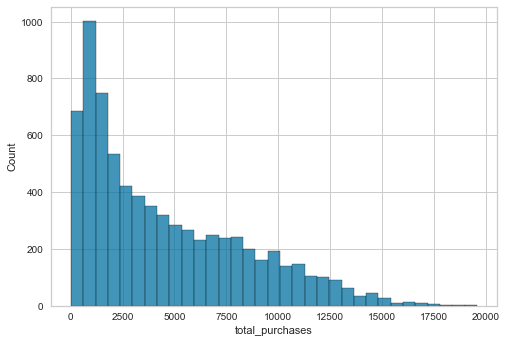

In [36]:
sns.histplot(ds1.total_purchases)

In [37]:
# RFM Function for category creation
def RFMScore(x, col):
    if x <= ds1.quantile(0.25)[col]:
        return 1
    elif x <= ds1.quantile(0.5)[col]:
        return 2
    elif x <= ds1.quantile(0.75)[col]:
        return 3
    else:
        return 4

ds1['Rscore'] = ds1.recency.apply(RFMScore, col = 'recency')
ds1['Fscore'] = ds1.frequency.apply(RFMScore, col = 'frequency')
ds1['Mscore'] = ds1.total_purchases.apply(RFMScore, col = 'total_purchases')


Let's build now the RFM clusters in terms of population and avg values

In [38]:
ds1['RFM'] = ds1['Rscore'].astype(str) + ds1['Fscore'].astype(str) + ds1['Mscore'].astype(str) 

ds1.groupby(by = ['RFM'])['income'].count().reset_index().to_csv('RFM.csv')


We can see that the split using quartiles is quite uneven, mostly due to the skewed "Recency variable which makes the quartiles badly distributed. 

## <font color='#BFD72F'>4.2 - PCA & Clustering</font> <a class="anchor" id="cluster"></a>

### <font color='#BFD72F'>4.2.1 - Preparing PCA</font> <a class="anchor" id="SVD"></a>

In [39]:
ds_clean.head()

,age,gender_F,dependents,income,frequency,recency,perishables,beverages,frozen,canned,...,total_purchases,avg_purchase_value,online_purchase_value,spend_over_income,bundle_food,bundle_storage,share_bundle_food,share_bundle_storage,marital_together,educ_lev_low
0,20.0,1,0,71825.8,45.0,31.0,5188.38,3941.56,144.00,1447.92,...,11360.50,252.455556,10224.4500,0.158167,9129.94,2230.56,0.803657,0.196343,1,0
1,19.0,1,1,56058.2,14.0,17.0,1665.30,97.60,12.00,0.00,...,1943.50,138.821429,660.7900,0.034669,1762.90,180.60,0.907075,0.092925,1,0
2,22.0,0,1,78099.2,34.0,40.0,3711.00,1533.88,1283.52,445.32,...,8209.24,241.448235,3776.2504,0.105113,5244.88,2964.36,0.638900,0.361100,1,0
3,18.0,0,0,18324.2,17.0,24.0,1605.42,1594.08,43.44,413.28,...,3674.22,216.130588,1322.7192,0.200512,3199.50,474.72,0.870797,0.129203,0,1
4,22.0,0,1,19699.4,6.0,48.0,360.00,1590.48,40.32,187.20,...,2238.00,373.000000,1253.2800,0.113608,1950.48,287.52,0.871528,0.128472,1,1


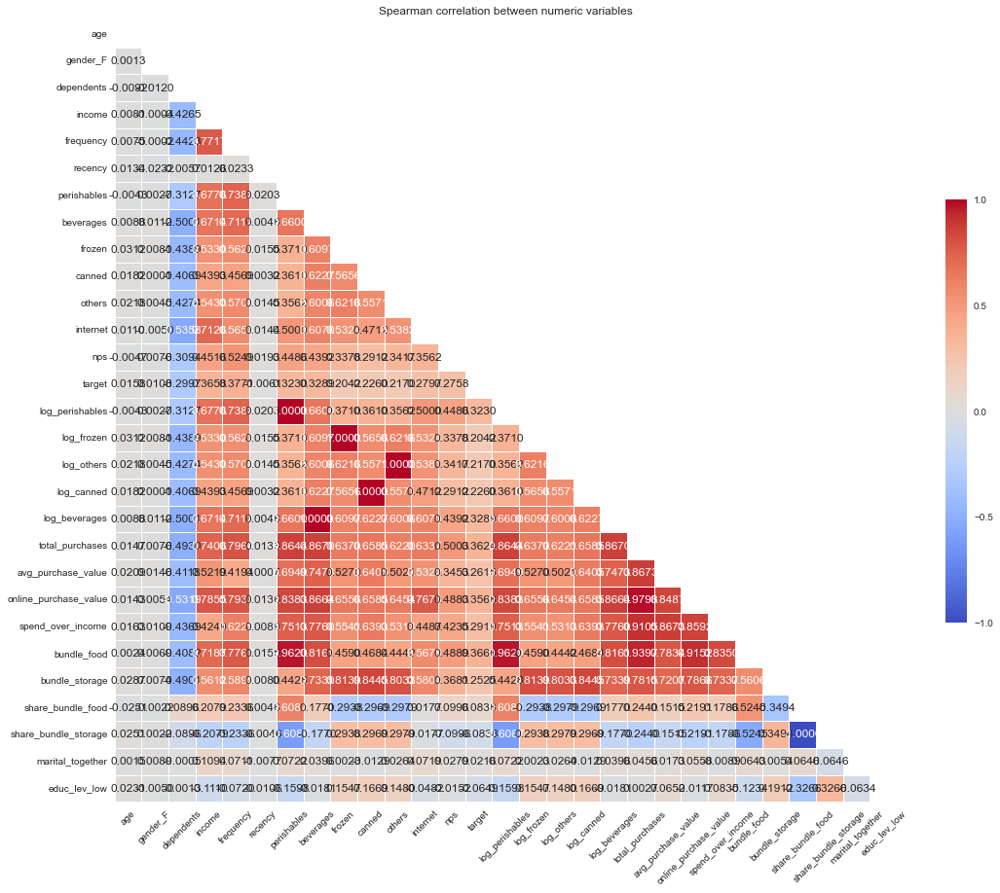

In [40]:
correlation_heatmap(ds_clean, ds_clean.columns, 'spearman')

In [41]:
ds_clean.columns

Index(['age', 'gender_F', 'dependents', 'income', 'frequency', 'recency',
       'perishables', 'beverages', 'frozen', 'canned', 'others', 'internet',
       'nps', 'target', 'log_perishables', 'log_frozen', 'log_others',
       'log_canned', 'log_beverages', 'total_purchases', 'avg_purchase_value',
       'online_purchase_value', 'spend_over_income', 'bundle_food',
       'bundle_storage', 'share_bundle_food', 'share_bundle_storage',
       'marital_together', 'educ_lev_low'],
      dtype='object')

In [42]:

ds2 = ds_clean.copy(deep = True )
ds2 = ds2.drop(columns = ['target'])
#ds2.drop(axis = 1, columns = ['custid'], inplace = True )
# drop na

ds2.dropna(inplace= True)

X_beforeNorm = ds2.copy(deep=True)

from sklearn.preprocessing import QuantileTransformer, MinMaxScaler
quantile = MinMaxScaler()

ds2 = pd.DataFrame(quantile.fit_transform(ds2.values), columns=ds2.columns,index=ds2.index)
remove = ['internet', 'age','dependents',  'income', 'nps', 'perishables', 'beverages', 'bundle_food', 'bundle_storage',
        'total_purchases', 'canned', 'others','beverages','log_canned', 'frozen', 'log_others', 'log_perishables'
        ]
ds2 = ds2.drop(columns = remove)



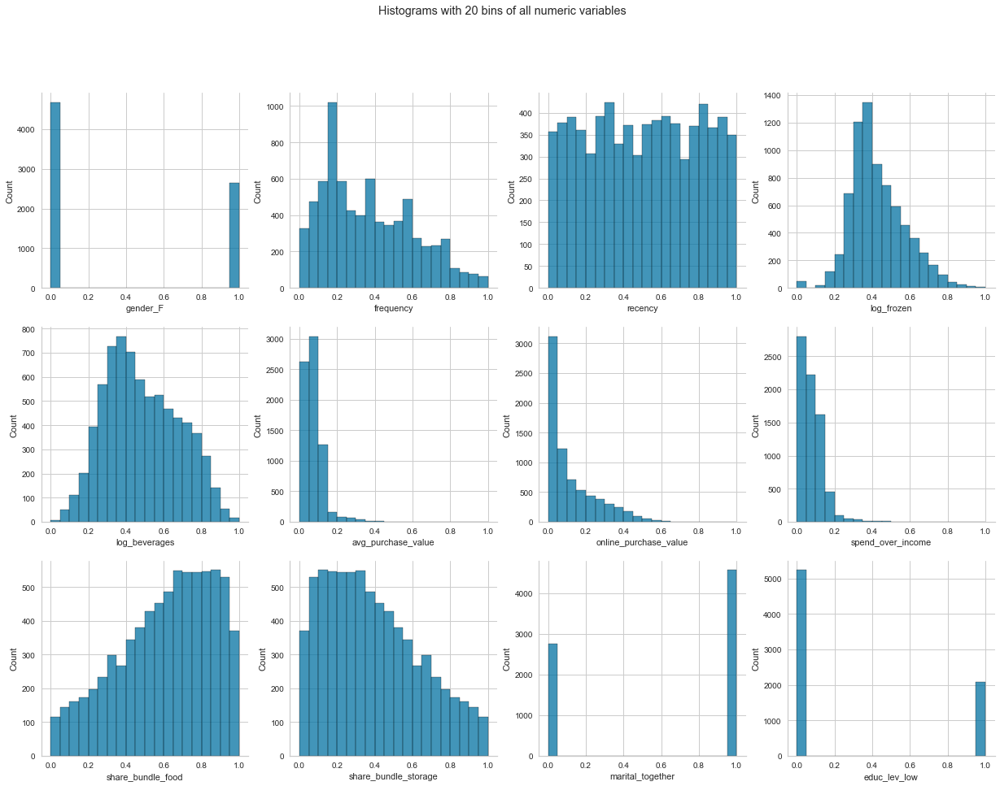

In [43]:

# Draw
fig, ax = plt.subplots(3, 4, figsize=(21,15))
for var, subplot in zip(ds2, ax.flatten()):
    g = sns.histplot(data=ds2,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Decoration
sns.despine()
plt.rc('axes')
fig.suptitle("Histograms with 20 bins of all numeric variables");

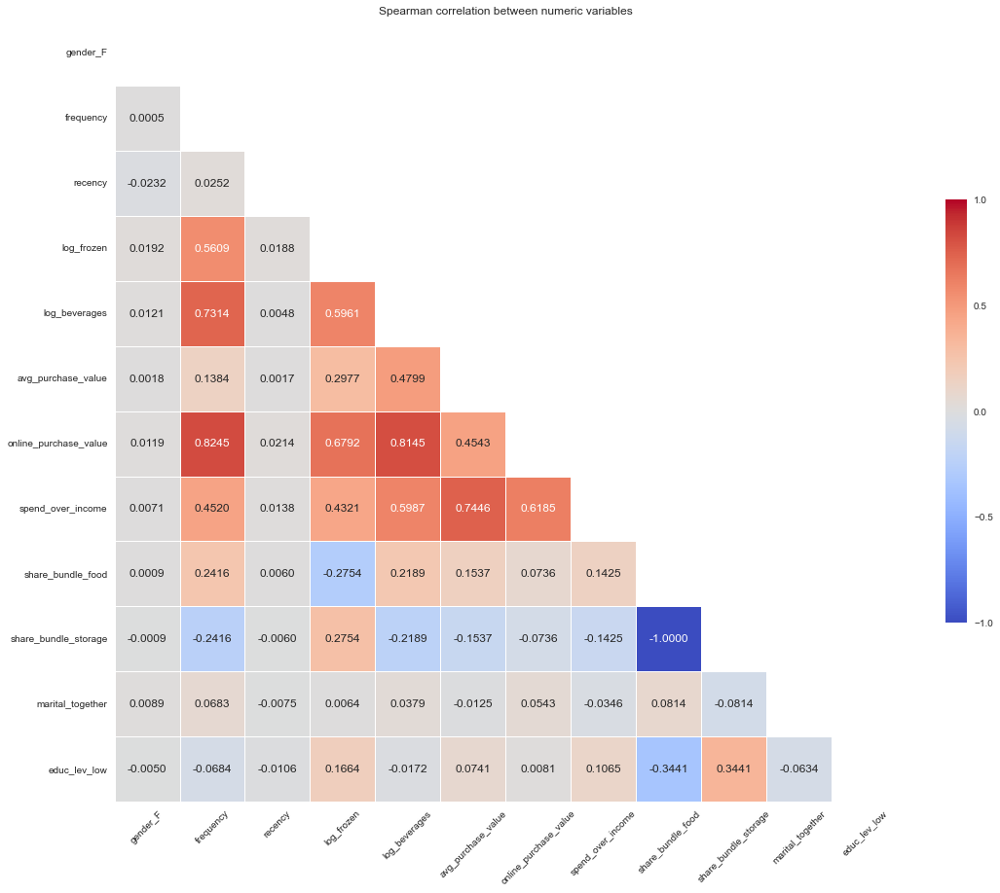

In [44]:
correlation_heatmap(ds2, ds2.columns, 'pearson')

In [45]:

## removing of the following variables

pca2 = TruncatedSVD(n_components = 5)
pca2.fit(ds2)
X_pca2 = pca2.transform(ds2)
print(X_pca2.shape)


(7323, 5)


/var/folders/tq/sy_s9jc96zj8wmk_td48vkn00000gn/T/ipykernel_57773/292104045.py:7: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



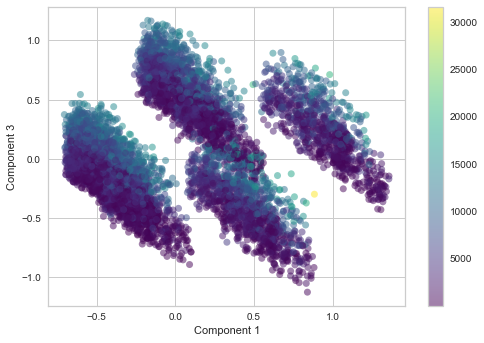

In [46]:

component1 = 1
component2 = 3
# Scatter plot of the two Principal Components by the "target" to see if there is any pattern
plt.scatter(X_pca2[:, component1], X_pca2[:, component2], c=ds_clean.total_purchases, edgecolor='none', alpha=0.5, cmap='viridis')
plt.xlabel('Component ' + str(component1))
plt.ylabel('Component ' + str(component2))
plt.colorbar();
# what about the LDA?



In [47]:
# fit PCA to dataset 
pca_trunc = TruncatedSVD(n_components= len(ds2.columns)-1).fit(ds2)

# Show the variance per component
pcaevr = ['{:f}'.format(item) for item in pca_trunc.explained_variance_ratio_]
pcaDF = pd.DataFrame({'Component': range(1, len(ds2.columns)),
                      'Variance explained': pcaevr,
                      'Cumulative variance explained': np.cumsum(pca_trunc.explained_variance_ratio_)})
pcaDF

,Component,Variance explained,Cumulative variance explained
0,1,0.118484,0.118484
1,2,0.243352,0.361836
2,3,0.222668,0.584504
3,4,0.174604,0.759108
4,5,0.096773,0.855881
5,6,0.083130,0.939011
6,7,0.035408,0.974419
7,8,0.012683,0.987102
8,9,0.006468,0.993570
9,10,0.003981,0.997552


Text(0, 0.5, 'Variance explained')

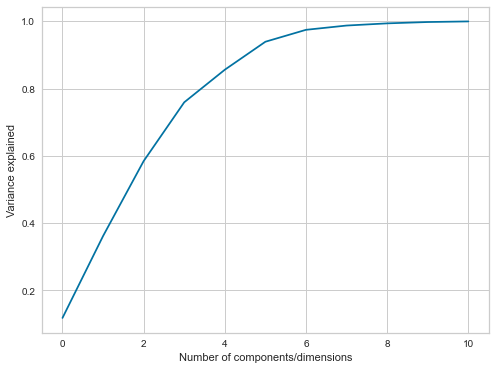

In [48]:
# Plot the cumulative explained variance

# Draw
fig , ax = plt.subplots(figsize=(8, 6))
plt.plot(np.cumsum(pca_trunc.explained_variance_ratio_))

# Decoration

plt.xlabel('Number of components/dimensions')
plt.ylabel('Variance explained')

# 8 components seems to be more than enough

In [49]:

pca_reduced = TruncatedSVD(n_components = 7)

pca_reduced.fit(ds2)
X_pca_reduced = pca_reduced.transform(ds2) 
print(X_pca_reduced.shape)


(7323, 7)


### <font color='#BFD72F'>4.2.2 - Kmeans</font> <a class="anchor" id="models"></a>

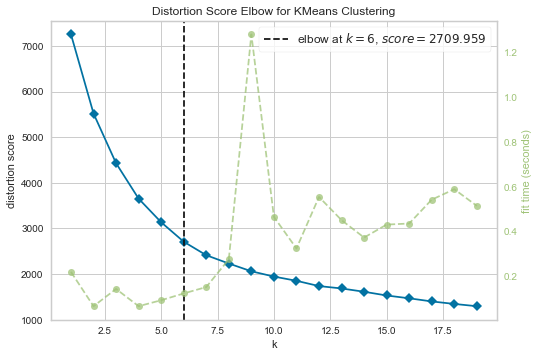

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [50]:
# Apply the Elbow method to select K
km = KMeans(init='k-means++', n_init=10, max_iter=300, random_state=123)

visualizer = KElbowVisualizer(km, k=(1,20), random_state=123)
visualizer.fit(X_pca_reduced)
visualizer.show() 

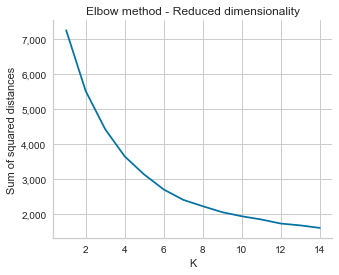

In [51]:
# Select K based on the sum of squared distances - Elbow method
ssd = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=300, random_state=123)
    km = km.fit(X_pca_reduced)
    ssd.append(km.inertia_)
    
# Show Results
# Draw
fig , ax = plt.subplots(figsize=(5, 4))
plt.plot(K, ssd, 'bx-')
# Decoration
sns.despine()
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
plt.xlabel('K')
plt.ylabel('Sum of squared distances')
plt.rc('axes')
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.title('Elbow method - Reduced dimensionality');

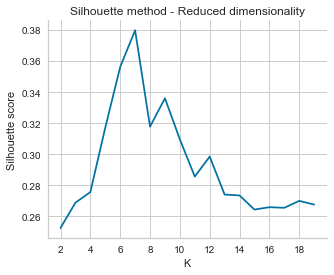

In [52]:
# Select K based on the Silhouette method
# ATTENTION! Depending on the computer this can take long time to run (more than 10 minutes)
sil = []

for k in range(2, 20):
  km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=300, random_state=123).fit(ds2)
  labels = km.labels_
  sil.append(silhouette_score(ds2, labels, metric = 'euclidean'))


# Show Results
# Draw
fig , ax = plt.subplots(figsize=(5, 4))
plt.plot(range(2, 20), sil, 'bx-')
# Decoration
sns.despine()
fmt = "{x:,.2f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
plt.xlabel('K')
plt.ylabel('Silhouette score')
plt.rc('axes')
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.title('Silhouette method - Reduced dimensionality');

In [53]:
# Apply the K-Means for K=4
K=6
kmeans = KMeans(n_clusters=K, init='k-means++', n_init=10, max_iter=300, random_state=123)
allDistances = kmeans.fit_transform(X_pca_reduced)
y_kmeans = kmeans.predict(X_pca_reduced)

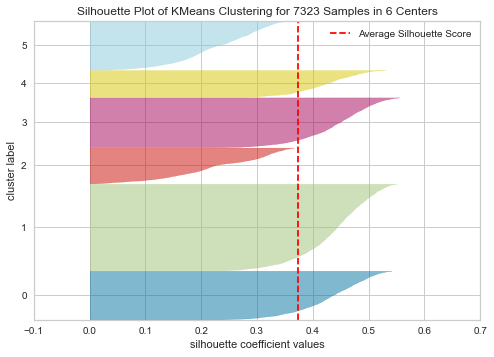

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 7323 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [54]:
# Visualize Silhouette 
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_pca_reduced)
visualizer.show()


### <font color='#BFD72F'>4.2.3 - K - Prototype</font> <a class="anchor" id="proto"></a>

Ad the dataset contains categorical variables and we see a weird trend in the silhouette curve, we attempt a comparison with KPrototype algorythm, to benchmark results regarding the K number of clusters 

In [55]:
# Import module for k-protoype cluster
from kmodes.kprototypes import KPrototypes

In [56]:
ds3 = X_before_encoding.copy(deep = True).drop(columns = 'target')
numerical_1 = list(ds3.select_dtypes(np.number).columns)

ds3[numerical_1] = pd.DataFrame(quantile.fit_transform(ds3[numerical_1].values), columns=numerical_1,index=ds3.index)

catColumnsPos = [ds3.columns.get_loc(col) for col in list(ds3.select_dtypes('object').columns)]
print('Categorical columns           : {}'.format(list(ds3.select_dtypes('object').columns)))
print('Categorical columns position  : {}'.format(catColumnsPos))

Categorical columns           : ['gender', 'marital', 'educ_lev']
Categorical columns position  : [1, 26, 27]


In [57]:
dfMatrix = ds3.to_numpy()
print(f'Dimensions of the dataset - {dfMatrix.shape[0]} ROWS and {dfMatrix.shape[1]} COLUMNS')

Dimensions of the dataset - 8000 ROWS and 28 COLUMNS


In [58]:
cost = []
silhouette_avg = []
for cluster in range(1, 10):
    try:
        kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster, init = 'Huang', random_state = 12)
        kprototype.fit_predict(dfMatrix, categorical = catColumnsPos)
        cost.append(kprototype.cost_)
        cluster_labels = kprototype.labels_
        #silhouette_avg.append(silhouette_score(ds3[numerical_1], cluster_labels))
        print('Cluster initiation: {}'.format(cluster))
    except:
        break

Cluster initiation: 1
Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7
Cluster initiation: 8
Cluster initiation: 9


In [59]:
# Converting the results into a dataframe and plotting them
df_cost = pd.DataFrame({'Cluster':range(1, 10), 'Cost':cost})
df_cost.head()

,Cluster,Cost
0,1,7275.257996
1,2,4963.131312
2,3,4302.136937
3,4,3913.122131
4,5,3624.470031


<AxesSubplot:xlabel='Cluster', ylabel='Cost'>

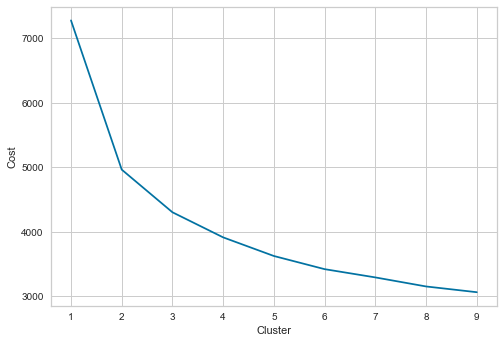

In [60]:
sns.lineplot(data = df_cost, x = 'Cluster', y = 'Cost')

In [61]:
# Fit the cluster
kprototype = KPrototypes(n_jobs = -1, n_clusters = 8, init = 'Huang', random_state = 12)
y_kpromeans = kprototype.fit_predict(dfMatrix, categorical = catColumnsPos)
silhouette_score(ds3[numerical_1], kprototype.labels_)


0.19027569362649996

### <font color='#BFD72F'>4.2.4 - Kmeans and Kprototype Clusters evaluation</font> <a class="anchor" id="eval"></a>

In [62]:
# Plot clusters cardinality 

def cluster_cardinality(ds,y_kmeans):
    # to be applied to before normalization dataset
    # Count observations per cluster
    freqByCluster = ds.groupby(y_kmeans).size()

    # Draw
    fig, ax = plt.subplots(figsize=(7,5))
    g = sns.countplot(x=y_kmeans, color='grey')

    # Decoration
    fmt = "{x:,.0f}"
    tick = ticker.StrMethodFormatter(fmt)
    ax.yaxis.set_major_formatter(tick)
    for index,data in enumerate(freqByCluster):
        plt.text(x=index-0.2 , y=data+50 , s=f"{data}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
    sns.despine()
    plt.title("Cluster cardinality", fontsize=plots_Title_fontSize)
    plt.xlabel("Cluster")
    plt.ylabel("Frequency in cluster")
    plt.rc('axes', labelsize=subPlots_label_fontSize)

In [63]:
# Plot clusters magnitude
def cluster_magnitude(allDistances, ds2, y_kmeans):
    # Compute Magnitude
    ds2['distanceToCentroid'] = np.min(allDistances,axis=1)
    magnitude = ds2['distanceToCentroid'].groupby(y_kmeans).sum()
    X = ds2.drop(columns=['distanceToCentroid'])

    # Draw
    fig, ax = plt.subplots(figsize=(7,5))
    g = sns.barplot(x=magnitude.index, y=magnitude.values, color='grey')

    # Decoration
    fmt = "{x:,.0f}"
    tick = ticker.StrMethodFormatter(fmt)
    ax.yaxis.set_major_formatter(tick)
    for index,data in enumerate(magnitude):
        plt.text(x=index-0.2 , y=data+50 , s=f"{data:,.0f}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
    sns.despine()
    plt.title("Cluster magnitude", fontsize=plots_Title_fontSize)
    plt.xlabel("Cluster")
    plt.ylabel("Sum of distances to centroid")
    plt.rc('axes', labelsize=subPlots_label_fontSize)

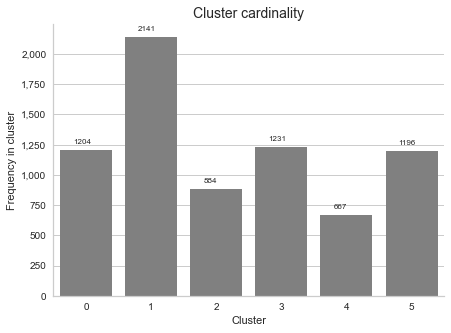

In [64]:
cluster_cardinality(X_beforeNorm,y_kmeans)

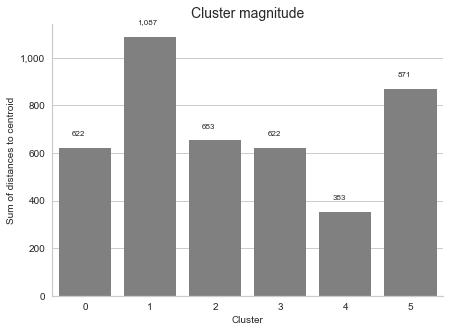

In [65]:
cluster_magnitude(allDistances, ds2, y_kmeans)

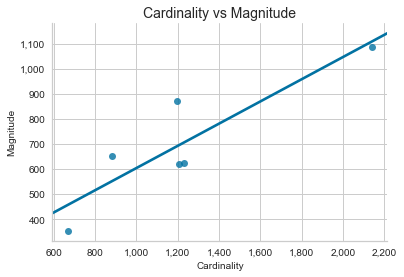

In [66]:
# Plot cardinality vs magnitude

# Draw
freqByCluster = X_beforeNorm.groupby(y_kmeans).size()
magnitude = ds2['distanceToCentroid'].groupby(y_kmeans).sum()

fig, ax = plt.subplots(figsize=(6,4))
g = sns.regplot(x=freqByCluster, y=magnitude, scatter=True, seed=123,truncate=False, ci=None)

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.xaxis.set_major_formatter(tick)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Cardinality vs Magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cardinality")
plt.ylabel("Magnitude")
plt.rc('axes', labelsize=subPlots_label_fontSize)

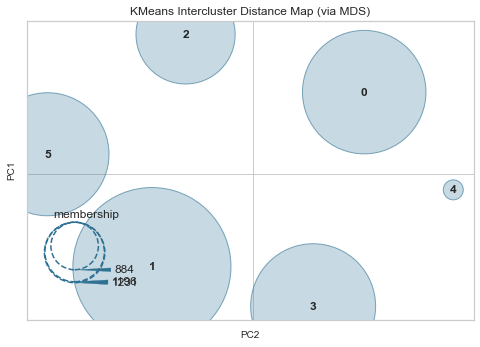

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [67]:
# Visualizing the clusters sizes and distances in 2D
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X_pca_reduced)
visualizer.show()

In [68]:
# Create a dataframe with the weights per component
X = ds2.drop(columns=['distanceToCentroid'])
wheightsDF = pd.DataFrame(pca_trunc.components_,columns=X.columns)

In [69]:
wheightsDF

,gender_F,frequency,recency,log_frozen,log_beverages,avg_purchase_value,online_purchase_value,spend_over_income,share_bundle_food,share_bundle_storage,marital_together,educ_lev_low
0,0.273614,0.268583,0.351165,0.298676,0.343193,0.052914,0.093344,0.056587,0.416439,0.257461,0.475421,0.205534
1,0.227019,-0.049636,0.039062,0.085335,-0.004140,0.007139,-0.002572,0.011452,-0.243233,0.307247,-0.463153,0.754262
2,0.883778,-0.013966,-0.049721,-0.047116,-0.019984,-0.005302,-0.012510,-0.006443,0.076099,-0.120110,-0.266757,-0.349353
3,-0.292087,0.284154,0.268622,0.152397,0.277813,0.042024,0.119448,0.056055,0.346093,-0.093895,-0.689028,-0.197098
4,-0.033748,-0.197784,0.598317,0.065099,-0.135520,-0.031181,-0.087540,-0.043601,-0.356723,0.533491,-0.033909,-0.394468
5,-0.012702,0.371718,-0.529598,0.285040,0.288899,0.020065,0.245443,0.051073,-0.396623,0.365064,0.002293,-0.250281
6,0.076774,0.434709,0.399881,-0.128217,0.024058,-0.029488,0.291475,0.032669,-0.530232,-0.489237,0.108483,0.095121
7,0.004471,-0.615063,0.044394,0.068182,0.596170,0.337883,0.166378,0.203465,-0.184039,-0.204262,0.023233,-0.016158
8,0.000092,-0.133202,0.006415,0.833617,-0.438270,0.098469,0.085078,0.067309,-0.031842,-0.269617,0.003785,-0.005625
9,-0.000997,0.048890,-0.012094,-0.272660,-0.388109,0.503445,0.453658,0.502344,0.145410,0.198921,-0.001109,-0.012802


In [70]:

comp = abs(wheightsDF.iloc[7])  
comp = comp.sort_values(ascending=False)
comp

frequency                0.615063
log_beverages            0.596170
avg_purchase_value       0.337883
share_bundle_storage     0.204262
spend_over_income        0.203465
share_bundle_food        0.184039
online_purchase_value    0.166378
log_frozen               0.068182
recency                  0.044394
marital_together         0.023233
educ_lev_low             0.016158
gender_F                 0.004471
Name: 7, dtype: float64

In [71]:
ds2['cluster'] = pd.Series(y_kmeans, index=ds2.index)
# get the original data set
full_db = ds_clean.merge(ds2['cluster'], how = 'inner', left_index= True, right_index = True)
full_db.columns
full_db.groupby(by = 'cluster').mean().T

cluster,0,1,2,3,4,5
age,21.094684,21.130313,21.143665,20.974817,21.223388,21.110368
gender_F,0.000000,0.000000,0.351810,1.000000,1.000000,0.360368
dependents,0.709302,0.691733,0.695701,0.699431,0.664168,0.690635
income,46451.063953,48965.884447,39095.879186,48679.409098,46486.324438,46563.121572
frequency,20.464286,21.435311,18.123303,21.499594,20.463268,20.505853
recency,51.383721,50.375058,49.552036,49.302193,49.385307,49.590301
perishables,2232.145764,2374.173377,1500.676968,2389.396621,2258.102069,1772.290485
beverages,799.091827,832.793947,727.046968,846.530138,830.201499,839.543043
frozen,433.617807,455.179468,693.574344,494.789050,471.688336,815.804281
canned,420.868306,435.410107,660.324027,412.975662,461.161619,772.729298


In [72]:
ds3['cluster'] = pd.Series(y_kpromeans, index=ds3.index)
# get the original data set
full_db_pro = ds_clean.merge(ds3['cluster'], how = 'inner', left_index= True, right_index = True)
full_db_pro.columns
full_db_pro.groupby(by = 'cluster').mean().T

cluster,0,1,2,3,4,5,6,7
age,21.138918,21.017857,21.062382,21.202783,21.075680,21.171565,21.226395,20.965264
gender_F,0.353128,0.392857,0.327032,0.377734,0.353741,0.351333,0.380901,0.366733
dependents,1.000000,0.000000,0.000000,0.001988,1.000000,1.000000,0.000000,1.000000
income,58979.335525,27927.927143,46410.922495,68422.405964,31665.516837,40146.839371,68043.154721,40179.790247
frequency,30.107105,13.107143,18.718336,33.099404,12.304422,15.392344,35.465665,15.055444
recency,51.671262,50.350000,49.302457,52.041750,48.713435,75.422420,49.916309,24.869739
perishables,4260.289120,335.164929,1921.803062,2537.361948,282.885867,1462.168831,4859.235966,1509.357034
beverages,1012.398940,264.130000,741.410057,2106.664175,197.431020,388.303377,2232.270172,418.500521
frozen,687.924369,441.129857,409.215652,2346.385606,349.089830,200.421490,886.281502,207.375711
canned,626.661124,463.967143,416.765671,2119.718966,338.750510,186.952946,839.771202,200.886814


## <font color='#BFD72F'>4.3 - Classification: Logistic regression</font> <a class="anchor" id="log"></a>

We proceed now to solve the **classification** problem adopting two strategies:

*  on one hand we care about a more *holistic* understanding of the data and the phenomenon we are studying, so we opt for a more explainable model, like a Logistic regression 
*  for a performance point of view, we will proces the data using PCA preprocessing and more advance model, as we don't care about interpretation now but more about performance  


### <font color='#BFD72F'>4.3.1 - MOdelling Classification</font> <a class="anchor" id="class"></a>

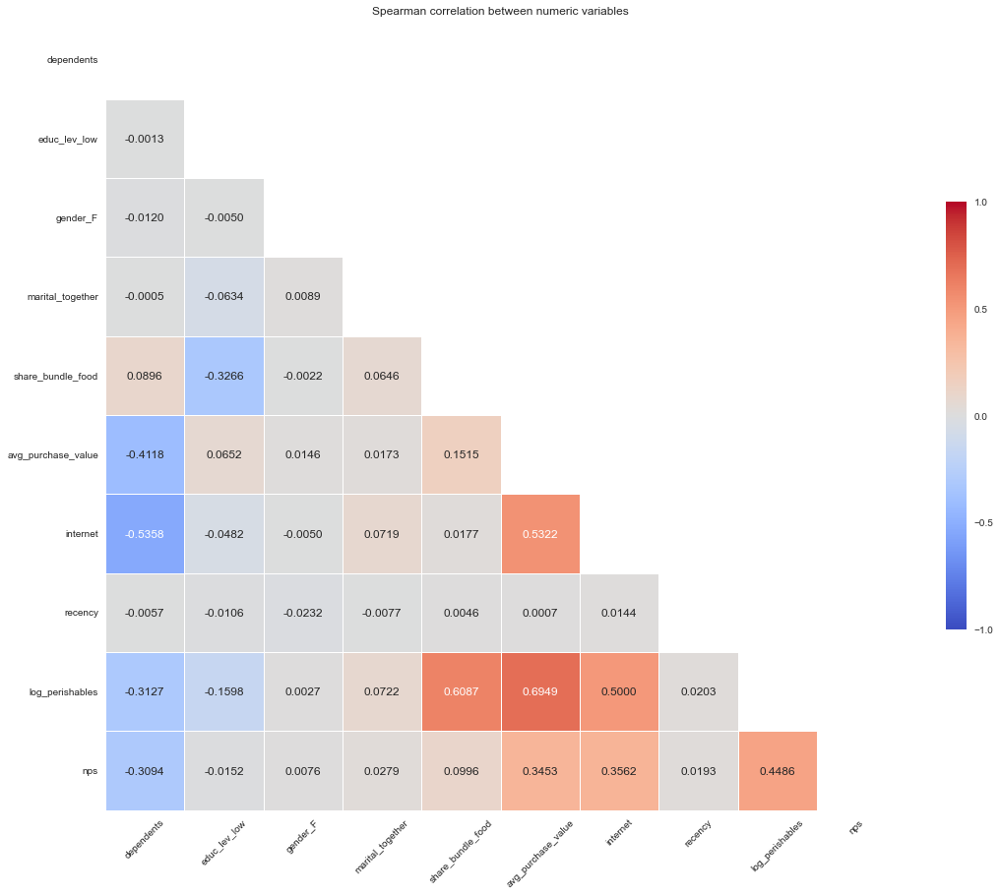

In [73]:
# first we check again the correlation among factors and discart the correlated ones
avoid = set(['age', 'income', 'frequency', 'total_purchases', 'beverages', 
            'perishables', 'frozen', 'canned', 'others', 'online_purchase_value', 'spend_over_income','bundle_food',
            'share_bundle_storage', 'target', 'log_beverages', 'log_frozen', 'log_canned', 'log_others','bundle_storage'
            ])
take = set(ds_clean.columns)
list_take = take - avoid
list_take = list(list_take)
correlation_heatmap(ds_clean[list_take], list_take, 'spearman')


Before doing the classification we remove all possible redundant, narrow variance or correlated features. 
In this way we hope to find a more robust model and less sensitive to variable variation.

In [74]:
# we take only the 1700 values that have target 
ds_lr = ds_clean.loc[ds_clean.target.isin([0,1])]


In [75]:
ds_lr.columns
ds_lr.shape

(1615, 29)

In [76]:

#Create target variable
X_lr = ds_lr.drop(columns = ['target'])[list_take]
y_lr = ds_lr['target']

In [77]:

# Split into train and test
from sklearn.model_selection import train_test_split

# We decide to stratify since we have seen that the amount of value "0" and "1" in the target variable are very different
X_train, X_test, y_train, y_test = train_test_split(X_lr, y_lr, test_size=0.25, stratify=y_lr, random_state=123)
# Dataframe for scaling
tempDF = X_lr.copy(deep=True)

# Normalize training/test data, in order to understand the importance of each variable in this LR
scaler = MinMaxScaler(feature_range=(0, 1))
tempDF_scaled = scaler.fit_transform(tempDF)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
#If we use oversampling to remove imbalance, as we are treating an inequal dataset for the target variable

# Import package
from imblearn.over_sampling import SMOTE

# Applyting SMOTE to generare new instances (oversampling)
sm = SMOTE(random_state=123, sampling_strategy=1.0)
X_train_scaled_lr, y_train_lr = sm.fit_resample(X_train_scaled, y_train)
# Create object and train the model
classModel = LogisticRegression(solver = 'saga', random_state=123, l1_ratio = 0.7,max_iter=200, penalty = 'elasticnet')
classModel.fit(X_train_scaled_lr, y_train_lr)

# Predict values
# predict y for X_train and X_test
y_pred_train = classModel.predict(X_train_scaled_lr) 
y_pred_test = classModel.predict(X_test_scaled) 

In [78]:
from sklearn.feature_selection import SequentialFeatureSelector

sfs = SequentialFeatureSelector(classModel, n_features_to_select=8)
sfs.fit(X_train_scaled_lr, y_train_lr)

sfs.get_support()

X_lr.columns[sfs.get_support()]

forward_selection = list(X_lr.columns[sfs.get_support()])

### <font color='#BFD72F'>4.3.2 - Evaluation Classification</font> <a class="anchor" id="ev_class"></a>

In [79]:
# Function to create dataframe with metrics
def performanceMetricsDF(metricsObj, yTrain, yPredTrain, yTest, yPredTest):
  measures_list = ['ACCURACY','PRECISION', 'RECALL','F1 SCORE','AUC']
  train_results = [metricsObj.accuracy_score(yTrain, yPredTrain),
                metricsObj.precision_score(yTrain, yPredTrain),
                metricsObj.recall_score(yTrain, yPredTrain),
                metricsObj.f1_score(yTrain, yPredTrain),
                metricsObj.roc_auc_score(yTrain, yPredTrain)
                ]
  test_results = [metricsObj.accuracy_score(yTest, yPredTest),
               metricsObj.precision_score(yTest, yPredTest),
               metricsObj.recall_score(yTest, yPredTest),
               metricsObj.f1_score(yTest, yPredTest),
               metricsObj.roc_auc_score(yTest, yPredTest)
               ]
  resultsDF = pd.DataFrame({'Measure': measures_list, 'Train': train_results, 'Test':test_results})
  return(resultsDF)

In [80]:
# predict y for X_train and X_test
y_pred_train = classModel.predict(X_train_scaled) 
y_pred_test = classModel.predict(X_test_scaled) 

In [81]:
# Function to plot confusion matrix - Adapted from https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    
    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    ax = sns.heatmap(cf,annot=box_labels, fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

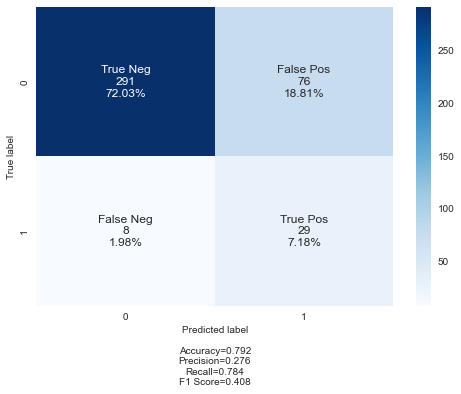

In [82]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_pred_test)
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['0', '1']
make_confusion_matrix(cf, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

In [83]:
resultsDF = performanceMetricsDF(metrics, y_train, y_pred_train, y_test, y_pred_test)
resultsDF

,Measure,Train,Test
0,ACCURACY,0.805945,0.792079
1,PRECISION,0.295455,0.276190
2,RECALL,0.834862,0.783784
3,F1 SCORE,0.436451,0.408451
4,AUC,0.818974,0.788350


In [84]:
# Check AUC
FP,TP,thresholds = metrics.roc_curve(y_test,classModel.decision_function(X_test_scaled))
print("AUC:{}".format(metrics.auc(FP, TP))) # AUC of ROC

AUC:0.8081596582958981


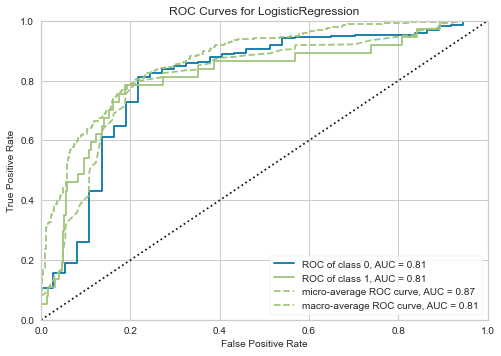

<AxesSubplot:title={'center':'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [85]:
# ROC curve
visualizer = ROCAUC(classModel, classes=['0','1'])
visualizer.fit(X_train_scaled, y_train)
visualizer.score(X_test_scaled, y_test)
visualizer.show()

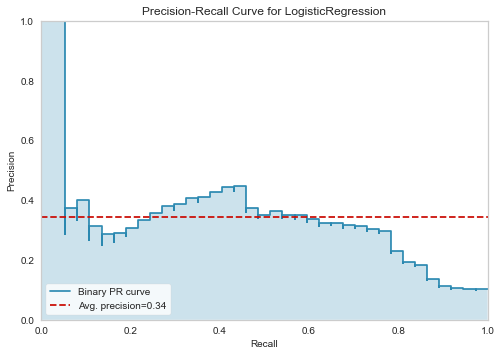

<AxesSubplot:title={'center':'Precision-Recall Curve for LogisticRegression'}, xlabel='Recall', ylabel='Precision'>

In [86]:
# Precison-Recall curve
visualizer = PrecisionRecallCurve(classModel, classes=['0','1'])
visualizer.fit(X_train_scaled, y_train)
visualizer.score(X_test_scaled, y_test)
visualizer.show()

In [87]:
# If we take a look to the top 10 coefficients, to get an idea of the most relevant variables in this model:
abs_coef = np.concatenate(np.abs(classModel.coef_))
sorted_index = np.argsort(abs_coef)[::-1] # sort indices
top_15 = sorted_index[:15]
top_15DF = pd.DataFrame(data={'feature': list(X_train.columns[top_15]), 'coef': abs_coef[top_15]})
top_15DF

,feature,coef
0,log_perishables,5.395547
1,nps,2.710614
2,avg_purchase_value,1.467839
3,dependents,1.205362
4,educ_lev_low,0.650924
5,internet,0.557119
6,marital_together,0.249162
7,gender_F,0.241640
8,share_bundle_food,0.214977
9,recency,0.158771


According to the prediction using logistic regression (LR) we can observe that:



*  The top 3 variables that are the most relevant in explaining if the customer will accept the last campaign (response - target variable) are: 


1.   the amount / share spent on food products
2.   Average value of purchase given by frequency 
3.   NPS given on average to products by the customer as index of general satisfaction


* Other features related to purchases, like "bundle Storage" and recency show also an impact on the target. 
* Overall, the target is strictly connected to the propensity of purchase by the customer. So the more the customer buys, the more it will convert to this target outcome. 

Given this outcome, we would recommend to focus the proposal of the "target" input to the customer with higher spent and higher frequency, and later also to reactivate the more "dormient" customers, whose recency is high.

# <font color='#BFD72F'>5 - Deployment</font> <a class="anchor" id="deploy"></a>

### <font color='#BFD72F'>5.1 - Deploy of model and prediction</font> <a class="anchor" id="deploy"></a>

Given the results of the Logistic Regression , we can now predict the values for the customer who don't have a target

In [88]:
# customers without target

missing = ds_clean.loc[ds_clean.target.isna()]


In [89]:
missing.shape

(5708, 29)

In [90]:

X_missing = missing.drop(columns = 'target')[list_take]
X_missing_scale = scaler.fit_transform(X_missing)

In [91]:
missing['target'] = classModel.predict(X_missing_scale) 

/var/folders/tq/sy_s9jc96zj8wmk_td48vkn00000gn/T/ipykernel_57773/3640884641.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [92]:
missing.describe().T

,count,mean,std,min,25%,50%,75%,max
age,5708.0,21.072880,2.584194,17.000000,19.000000,21.000000,23.000000,99.000000
gender_F,5708.0,0.364401,0.481304,0.000000,0.000000,0.000000,1.000000,1.000000
dependents,5708.0,0.694114,0.460822,0.000000,0.000000,1.000000,1.000000,1.000000
income,5708.0,46792.775158,17907.167701,7744.200000,32339.350000,46831.500000,61224.250000,83658.000000
frequency,5708.0,20.694464,10.739285,4.000000,12.000000,19.000000,29.000000,49.000000
recency,5708.0,49.981430,27.947672,2.000000,26.000000,50.000000,74.000000,98.000000
perishables,5708.0,2168.330519,2048.234167,2.400000,433.065000,1600.560000,3373.200000,11420.640000
beverages,5708.0,823.237274,952.422635,0.520000,149.760000,406.280000,1175.380000,5832.000000
frozen,5708.0,548.423308,808.285056,0.000000,112.320000,232.440000,639.270000,9061.120000
canned,5708.0,520.162249,842.629911,0.000000,44.970000,191.580000,647.040000,19599.280000



### <font color='#BFD72F'>5.2 - Business case evaluation</font> <a class="anchor" id="deploy"></a>

Based on the Recall and precision of the model we can calculate the Expected Net profit of the business case. 

In [93]:
resultsDF

,Measure,Train,Test
0,ACCURACY,0.805945,0.792079
1,PRECISION,0.295455,0.276190
2,RECALL,0.834862,0.783784
3,F1 SCORE,0.436451,0.408451
4,AUC,0.818974,0.788350


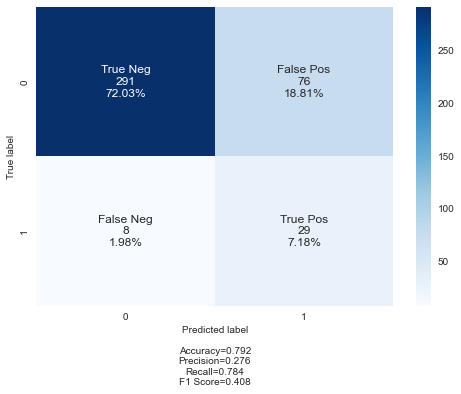

In [94]:
cf = metrics.confusion_matrix(y_test,y_pred_test)
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['0', '1']
make_confusion_matrix(cf, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

In [95]:
TN = cf[0][0] / np.sum(cf)
FP = cf[0][1] / np.sum(cf)
FN = cf[1][0] / np.sum(cf)
TP = cf[1][1] / np.sum(cf)

In [96]:
missing.target.count()

5708

In [97]:
Costs           = 3 *(len(missing.target) * (FP + TP))
Missed_Profit   = -25 *len(missing.target)* FN
GProfit         = 28 *(len(missing.target) * (TP))
NetProfit       = GProfit - Costs + Missed_Profit
print(f'{GProfit} - {Costs} + {Missed_Profit}')
print(f'Net profit of the campaign by contacting all customers will be {round(NetProfit,2)} €')

11472.514851485146 - 4450.544554455446 + -2825.742574257426
Net profit of the campaign by contacting all customers will be 4196.23 €
